<a href="https://colab.research.google.com/github/JSisam54/JSisam54/blob/main/end_to_end_classification_pithchartm.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## This is my Colab Facial Eczema Notebook. 

It builds an end to end binary image classifier using TensorFlow 2.0 and TensorFlow Hub.

**1. Problem**

Automating the process of identifying and counting toxic spores of Pithomyces Chartarum in pasture washes. So spore counts can be done faster and with more accuracy. This is essentially a classification problem.

Given an image of a spore like object found under the microscope the model must decide if it is a P.Chartarum spore or not. And classify it as accurately as possible.Future work will focus on building a tool that can count. For example count the number of spores in a grid.

Accurate and timely farm paddock spore counts enable dairy farmers to make decisions on whether dairy cows and young livestock on the farm need protecting. 

**2. Data**

The data we'll be using is from TPCC data sets. A Zip file of training images to upload into this CoLab notebook. A data set of 500 images.400 of them will become the training set of images and the other 100 will be the validation set. A separate label CSV file will have the image 'id's with a classification label. 

I've been getting Python error trying to batch y_train. I think it has something to do with the labels. I could reclassify them differently. Like a A "PCS" for a P.Chartarum fungal spore and a "SE" for this is something else. Hopefully that will solve the problem. 

There will also be another Zip file of test images with no labels so we can see how well the model(s) do.

**3. Evaluation**

The evaluation could be a file with prediction probabilities for each classification of each test image.

Classification of the training/validation sets will likely involve collaboration with other trusted professionals like Gribbles or SVS laboratory personnel, EpiVet Veterinarians and Vetent Large Animal Technicians.

**4. Features**

Some information about the data:

 * We're dealing with images or unstructured data so we'll use deep learning/supervised learning.

 * Initially there will be two classes. Those images showing P.Chartarum spores and those that show objects that aren't.

 * There are 500 images in the first training/validation set. These images have labels.

 * And about 100, 300 or 500 in the test set. These images have no labels because the model we build is going to predict them.


In [ ]:
# Unzip the uploaded train data into Google Drive
# Okay so I'm going to upload the zip file again, be patient and make sure it does it completely
#!unzip "drive/MyDrive/P Chartarum Vision/pithomyces-chartarum-classification.zip" -d "drive/MyDrive/P Chartarum Vision/"



# Today's Lesson

Naming my photos correctly is important. There must be no underscores or gaps just numbers and/or letters!!

Also it's important to keep Google Colab open while it's uploading so all the files are there and not just some of them or an 'empty' zip file name with nothing in it.

Otherwise you get an error trying to unzip the file. 

In [ ]:
# I was getting an error trying to unzip my 500 "trainjpg" photos 
# I thought I had uploaded the entire zip folder correctly. But I had not.
# It's important to stick with this notebook while the zip folder is being uploaded
# to make sure ALL the images get uploaded correctly. Don't leave it to go and do something else.
# BE PATIENT

# Get Our Workspace Ready

 * Import TensorFlow 2.x
 * Import TensorHub
 * Make sure we're using a GPU

In [ ]:
# Import TensorFlow 2.0 into CoLab
import tensorflow as tf
print("TF Version:", tf.__version__)

TF Version: 2.9.2


In [ ]:
# Import TensorFlow Hub
import tensorflow_hub as hub
print("TFHub Version:", hub.__version__)


TFHub Version: 0.12.0


In [ ]:
# Check for GPU availability
print("GPU", "IS available. : )" if tf.config.list_physical_devices("GPU") else "Sorry, not available")

GPU IS available. : )


# Getting our Data Ready - Turning it into Tensors or Matrices

With all Machine Learning Models, our data must be in numerical format. So this is what we need to do first. We'll be turning our images into Tensors(arrays)

Let's start by accessing our data and checking out the labels.




In [ ]:
# The labels for our training images is a csv file. We'll use Pandas to get the file into this notebook.
import pandas as pd
fe_labels_csv = pd.read_csv("drive/MyDrive/P Chartarum Vision/fe_labels.csv")
print(fe_labels_csv.describe())


                 id
count  5.000000e+02
mean   1.414957e+09
std    8.665345e+08
min    2.022051e+07
25%    2.022061e+08
50%    2.022061e+09
75%    2.022061e+09
max    2.022062e+09


In [ ]:

# Let's look at these labels and then check how many there are in each classification
print(fe_labels_csv.head())



          id classification
0   20220517            pcs
1  202205171            pcs
2  202205172            pcs
3  202205173            pcs
4  202205174             se


In [ ]:
fe_labels_csv[255:260]

,id,classification
255,202206113,pcs
256,202206114,pcs
257,202206115,pcs
258,202206116,pcs
259,202206117,pcs


In [ ]:
# Let's delete the row with the missing image label using `.drop()`
fe_labels_csv = fe_labels_csv.drop([255])
fe_labels_csv.tail()

,id,classification
495,2022061637,se
496,2022061638,se
497,2022061639,se
498,2022061640,se
499,2022061641,se


In [ ]:
# What can we find out about this dataframe
fe_labels_csv.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 499 entries, 0 to 499
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   id              499 non-null    int64 
 1   classification  499 non-null    object
dtypes: int64(1), object(1)
memory usage: 11.7+ KB


In [ ]:
# How many in each classification?
fe_labels_csv["classification"].value_counts()

se     250
pcs    249
Name: classification, dtype: int64

# Preparing our Images



In [ ]:
# Let's view an image within this notebook
from IPython.display import Image

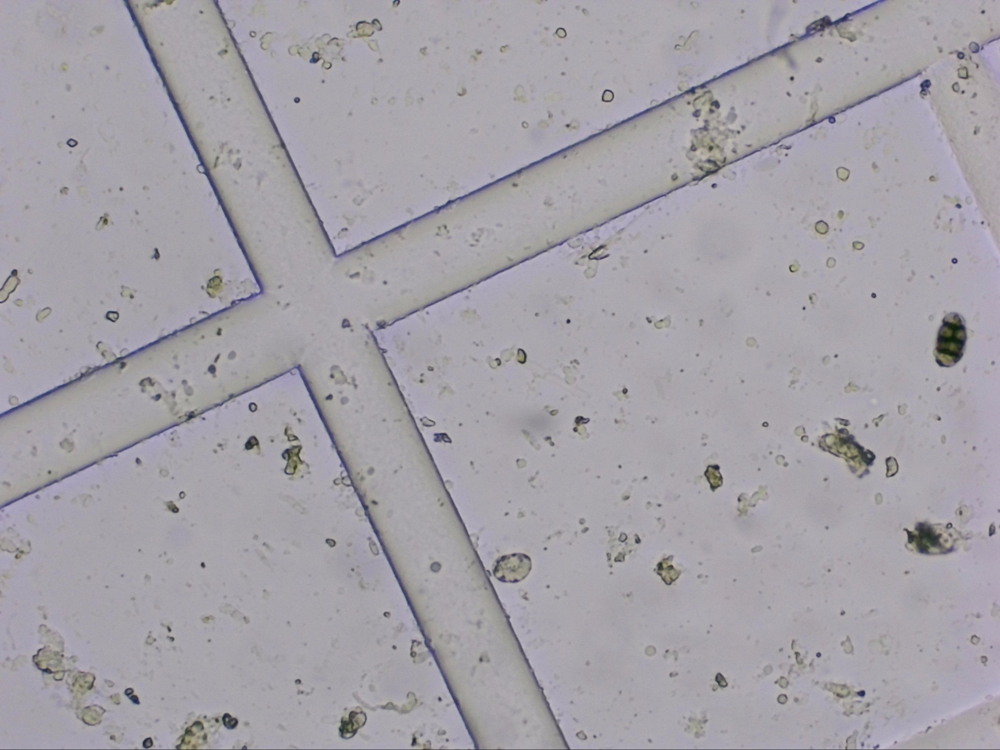

In [ ]:
Image("drive/MyDrive/P Chartarum Vision/trainjpg/202206114.jpg")

### Random contrast and brighten 

Why? 

1.   To expand my training data set using two tf.image functions - `tf.image.random_contrast` and `tf.image.random_brightness`
2.   As well as to reduce overfitting, although that doesn't seem to be problem at the moment



As well as to reduce any over fitting

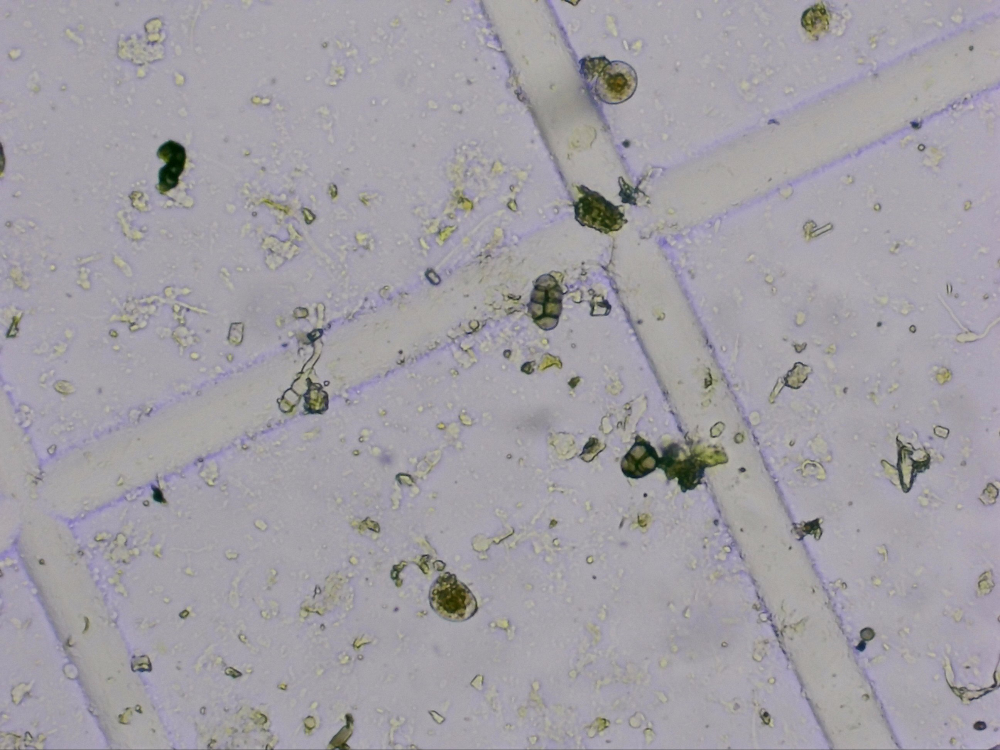

In [ ]:
# Lets give this a go 
fe_photo = Image("drive/MyDrive/P Chartarum Vision/trainjpg/202206112.jpg")
fe_photo

# Getting Images and Their Labels

Create pathnames from image ID's. 


In [ ]:
fe_labels_csv.head()

,id,classification
0,20220517,pcs
1,202205171,pcs
2,202205172,pcs
3,202205173,pcs
4,202205174,se


In [ ]:
# We need to convert the integers in the "id" column to strings
# so we can concantenate them
fe_labels_csv["id"] = fe_labels_csv["id"].astype(str)
fe_labels_csv["id"].head()





0     20220517
1    202205171
2    202205172
3    202205173
4    202205174
Name: id, dtype: object

In [ ]:
# Concantenation now "id" has been converted from an integer into a string
filenames = ["drive/MyDrive/P Chartarum Vision/trainjpg/" + fname + ".jpg" for fname in fe_labels_csv["id"]]
filenames[:3]



['drive/MyDrive/P Chartarum Vision/trainjpg/20220517.jpg',
 'drive/MyDrive/P Chartarum Vision/trainjpg/202205171.jpg',
 'drive/MyDrive/P Chartarum Vision/trainjpg/202205172.jpg']

In [ ]:
# Let's check how many of these filenames I have
len(filenames)

499

In [ ]:
# It must be the same as the number of the actual images I have in my train folder
# It's better to check it now rather than later 
import os

In [ ]:
# Check for hidden folders
os.path.isdir(".ipynb_checkpoints")

#actual_images = os.listdir("drive/MyDrive/P Chartarum Vision/trainjpg")
#actual_images[:3]


False

In [ ]:
actual_images = os.listdir("drive/MyDrive/P Chartarum Vision/trainjpg")

## Actual Image List

In [ ]:
# See what happens if I try and remove this folder assuming it is there
# os.removedirs(".ipynb_checkpoints")
# Okay so it's saying there is no such file or directory!

In [ ]:
# Let's check the length of this list 
len(actual_images)
                     
                        

499

In [ ]:
# Check the length of these two lists
if len(os.listdir("drive/MyDrive/P Chartarum Vision/trainjpg")) == len(filenames):
  print("Yay!! They match up. Proceed!")
else:
    print("Crap!! I've got more work to do!!")

Yay!! They match up. Proceed!


In [ ]:
# Compare the two arrays using np.setdifference1d to return the odd man out
# ar1_2_diff = np.setdiff1d(ar1, ar2, assume_unique=True)
# ar1_2_diff

In [ ]:
# Finally delete it from the training folder using !rm "drive/MyDrive/P Chartarum Vision/trainjpg/oddmanout"
# !rmdir "drive/MyDrive/P Chartarum Vision/trainjpg/.ipynb_checkpoints"

In [ ]:
# Let's check the length again 
len(actual_images)

499

YES I DID IT FINALLY. NEVER EVER GIVE UP. EVERYTHING IS FIGUREOUTABLE!!


# Turning Data Labels into Numbers

This should be simple. My classification labels are numerical already. But I need to convert each label into a numpy array so I can create a Tensor tuple....(image, label)

In [ ]:
# Turn our labels into an array
import numpy as np
fe_labels = fe_labels_csv["classification"]
fe_labels


0      pcs
1      pcs
2      pcs
3      pcs
4       se
      ... 
495     se
496     se
497     se
498     se
499     se
Name: classification, Length: 499, dtype: object

In [ ]:
# Now to turn them into an array
fe_labels = np.array(fe_labels)
fe_labels

array(['pcs', 'pcs', 'pcs', 'pcs', 'se', 'se', 'se', 'se', 'pcs', 'pcs',
       'pcs', 'se', 'se', 'se', 'pcs', 'pcs', 'pcs', 'se', 'pcs', 'pcs',
       'pcs', 'pcs', 'se', 'pcs', 'se', 'pcs', 'se', 'pcs', 'pcs', 'se',
       'pcs', 'se', 'pcs', 'se', 'se', 'se', 'se', 'se', 'pcs', 'se',
       'pcs', 'pcs', 'pcs', 'se', 'se', 'se', 'pcs', 'pcs', 'pcs', 'se',
       'pcs', 'se', 'se', 'se', 'se', 'se', 'se', 'se', 'se', 'pcs',
       'pcs', 'pcs', 'pcs', 'pcs', 'pcs', 'se', 'pcs', 'se', 'pcs', 'se',
       'pcs', 'se', 'se', 'se', 'se', 'se', 'pcs', 'pcs', 'se', 'pcs',
       'se', 'pcs', 'pcs', 'se', 'pcs', 'se', 'se', 'se', 'se', 'se',
       'se', 'se', 'pcs', 'pcs', 'pcs', 'pcs', 'pcs', 'pcs', 'pcs', 'se',
       'se', 'pcs', 'pcs', 'se', 'se', 'pcs', 'pcs', 'se', 'pcs', 'se',
       'pcs', 'se', 'se', 'se', 'pcs', 'pcs', 'pcs', 'se', 'se', 'se',
       'pcs', 'pcs', 'pcs', 'pcs', 'pcs', 'pcs', 'pcs', 'pcs', 'pcs',
       'pcs', 'pcs', 'pcs', 'pcs', 'pcs', 'pcs', 'pcs', 'pcs', 'pcs

In [ ]:
# Check how many I have
len(fe_labels)

499

In [ ]:
# See if the number of labels matches the number of filenames
if len(fe_labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels doesn't match number of filenames. Crap!!")

Number of labels matches number of filenames!


In [ ]:
# Let's convert these labels from strings into boolean
unique_spores = np.unique(fe_labels)
unique_spores

array(['pcs', 'se'], dtype=object)

In [ ]:
# Try one label
print(fe_labels[0])
fe_labels[0] == unique_spores

pcs


array([ True, False])

In [ ]:
# So the first image IS of a Pithomyces Chartarum spore. There's a "true" in the first index.
# Let's do this for all of them now
# So the first image is of a Pitho Chart spore. It's true. 
boolean_labels = [label == unique_spores for label in fe_labels]
boolean_labels[:2]

[array([ True, False]), array([ True, False])]

In [ ]:
# Another example
boolean_labels[54]

array([False,  True])

In [ ]:
# And it's corresponding filename
filenames[54]

'drive/MyDrive/P Chartarum Vision/trainjpg/2022052614.jpg'

In [ ]:
# Let's check out the first five
filenames[:5], boolean_labels[:5]


(['drive/MyDrive/P Chartarum Vision/trainjpg/20220517.jpg',
  'drive/MyDrive/P Chartarum Vision/trainjpg/202205171.jpg',
  'drive/MyDrive/P Chartarum Vision/trainjpg/202205172.jpg',
  'drive/MyDrive/P Chartarum Vision/trainjpg/202205173.jpg',
  'drive/MyDrive/P Chartarum Vision/trainjpg/202205174.jpg'],
 [array([ True, False]),
  array([ True, False]),
  array([ True, False]),
  array([ True, False]),
  array([False,  True])])

# Creating our own validation set.

We're going to create our own. 

We'll train our model on the training set and then evaluate it on our validation set. It will be like a practice exam.

In [ ]:
# In our ScikitLearn module we used ~train_test_split()~ from it's library
# We'll be doing something similar
# First set up our X and y variables
X = filenames
y = boolean_labels 

In [ ]:
# How many images shall I work with. Ideally 1000 but I only have 500 at the moment.
# I'll set up a slider later. Just keeping it simple for now.
NUM_IMAGES = 499 

In [ ]:
# Now to split our data into train and validation splits
from sklearn.model_selection import train_test_split

In [ ]:
# Split them into training and validation sets of total size = NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size=0.2,
                                                    random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(399, 399, 100, 100)

In [ ]:
# Let's have a quick look at the training data
X_train[:5], y_train[:5]

(['drive/MyDrive/P Chartarum Vision/trainjpg/2022052616.jpg',
  'drive/MyDrive/P Chartarum Vision/trainjpg/2022061021.jpg',
  'drive/MyDrive/P Chartarum Vision/trainjpg/2022061129.jpg',
  'drive/MyDrive/P Chartarum Vision/trainjpg/2022061629.jpg',
  'drive/MyDrive/P Chartarum Vision/trainjpg/2022061014.jpg'],
 [array([False,  True]),
  array([ True, False]),
  array([ True, False]),
  array([False,  True]),
  array([ True, False])])

In the Dog Vision Project there were multiple classifications or types of breeds. The data was in the form of a string e.g. "Labrador". 

We converted each label into a boolean by creating a variable "unique breed" and then passing each label through the 120 different breed options. The "True" value was the correct breed. 

I followed the same process and created a variable "unique_ spores"

# Preprocessing Images & Labels - Turning Them Into Tensors

### Creating a function to preprocess our images and labels into tensors
Here's what we want it to do:


1.   Take an image filepath as input 

2.   Use TensorFlow to read the file and save it to a variable, `image`

1.   Turn our `image`, a jpg, into Tensors and resize it to be (224,224)
2.   Finally return the modified image

Before we do that let's see what preprocessing one image and it's label looks like.
TensorFlow resources are in the Education folder.



In [ ]:
# Convert image into to a NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[54])
image.shape




(1944, 2592, 3)

In [ ]:

# So this image is 1944 high and 2592 wide with 3 colour channels
# Let's check out the minimum and maximum values
image.min(), image.max()

(0, 182)

In [ ]:
# The first two images - what do they look like?
image[:2]

array([[[135, 125, 133],
        [134, 124, 132],
        [133, 123, 131],
        ...,
        [157, 146, 163],
        [156, 145, 162],
        [156, 145, 162]],

       [[134, 124, 132],
        [133, 123, 131],
        [133, 123, 131],
        ...,
        [157, 146, 163],
        [157, 146, 163],
        [157, 146, 163]]], dtype=uint8)

In [ ]:
# Two three dimensional numpy arrays. 
# Now to convert them into tensors using tf.constant()
tf.constant(image[:2])

<tf.Tensor: shape=(2, 2592, 3), dtype=uint8, numpy=
array([[[135, 125, 133],
        [134, 124, 132],
        [133, 123, 131],
        ...,
        [157, 146, 163],
        [156, 145, 162],
        [156, 145, 162]],

       [[134, 124, 132],
        [133, 123, 131],
        [133, 123, 131],
        ...,
        [157, 146, 163],
        [157, 146, 163],
        [157, 146, 163]]], dtype=uint8)>

In [ ]:
# TensorFlow has converted the images into a tensor slices
# It will be faster to run our Deep Learning Model using Google's GPU with our images in this format


In [ ]:
# This is where I could use the `tf.image.random_contrast()` and `tf.image.random_brightness()` 
# to create a different lot of training pictures for my model

Now we've seen what an image looks like as a Tensor, we're going to preprocess it with code and then create a function to pre-process all of them.

In [ ]:
# Here's the function... 

IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
  """
This function takes an image file path and turns it into a tensor

  """
  image = tf.io.read_file(image_path)

  image = tf.image.decode_jpeg(image, channels=3)

  image = tf.image.convert_image_dtype(image, tf.float32)

  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])


  return image




In [ ]:
# Let's check this out
(process_image(X[54]), tf.constant(y[54]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.5404362 , 0.50357145, 0.52789116],
         [0.5734094 , 0.5341937 , 0.5707483 ],
         [0.5826331 , 0.5506303 , 0.6107143 ],
         ...,
         [0.6       , 0.5764706 , 0.5921569 ],
         [0.59607846, 0.5647059 , 0.61004376],
         [0.6020397 , 0.57066715, 0.6294907 ]],
 
        [[0.5542217 , 0.5306923 , 0.5306923 ],
         [0.5472689 , 0.5119748 , 0.53158265],
         [0.5473089 , 0.5159364 , 0.5590736 ],
         ...,
         [0.61278486, 0.5853339 , 0.61670643],
         [0.59663856, 0.565266  , 0.62408954],
         [0.6020308 , 0.5785014 , 0.63340336]],
 
        [[0.5639356 , 0.544908  , 0.5505002 ],
         [0.55924374, 0.52626055, 0.5294118 ],
         [0.56517607, 0.5518007 , 0.5471089 ],
         ...,
         [0.59740794, 0.5660354 , 0.6170158 ],
         [0.61534625, 0.5839737 , 0.6364947 ],
         [0.6119721 , 0.5710771 , 0.6377438 ]],
 
        ...,
 
        [[0.57426935, 0.5535712 

# Turning Data Into Batches

Tip from Daniel: When trying to find the best way to do something Google the topic e.g. "batch size" AND an expert in the field e.g. Yann Lecun or Jeremy Howard.

The reason for using small batches is that they don't take so much memory to process. It's a more efficient way of doing things.

TensorFlow likes our data in the form of a Tensor tuple. A tuple is a pair, it's ordered and also unchangeable. 
e.g. `(image, label)`

In [ ]:
# So TensorFlow will try and find patterns in these batches of 32 tuples
# Using a loop like system it will go through all 400 or 500 train and validation images with their labels


In [ ]:
# A function to create a tuple of Tensors
# We've defined the image now to find the label for it 
def get_image_label(image_path, label):

  """
  This function takes an image file path name and the associated label, processes the image and 
  returns a Tensor tuple of (image, label)
  
  """
  image = process_image(image_path)
  return image, label



## TURNING DATA INTO BATCHES

Now we've got a way to change our data into tuples of Tensors in the form `(image, label)`, let's make a function to batch it.

Here's a link to the relevant TensorFlow documentation.

[tf.data.Dataset](https://www.tensorflow.org/api_docs/python/tf/data/Dataset)

In [ ]:
# Define the batch size. 32 is a good start.
BATCH_SIZE = 32

# Create a function to turn data into batches
# We have three different sets - train, validation and test
# They need slightly different processes
# Note: "None" in Python is a Nonetype object, a null variable or object and is not 0 or any other value.
# It marks default parameters we haven't defined just yet

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
This function creates batches out of image(X) and label(y) pairs.
It shuffles the data if it's a training set but doesn't shuffle if it is a validation set
It also accepts test data as input even though it doesn't have a label or "y"
Tip from Daniel. If having trouble creating a function talk it out first as though you're talking to a rubber duck!

  """
# If the data is a test set it has no labels
  if test_data:
    print("Creating test data batches.....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

# If the data set is our validation set we don't have to shuffle it.
  elif valid_data:
    print("Creating validation data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                            tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

# Finally if the data set is our training set we do have to shuffle it
  else:
    print("Creating training data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), 
                                            tf.constant(y)))  
  # We shuffle the pathnames and labels before using the image processor function. 

    data = data.shuffle(buffer_size=len(X))

  # Create image label tuples - this turns the image path into a preprocessed image
    data = data.map(get_image_label)

# Finally turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)




Creating training data batches....
Creating validation data batches....


# Visualizing our Data to see What's Going On

Our data is now in batches. Lets create a function to visualize these image, label pairs.

In [ ]:
# Let's check out the attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 2), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 2), dtype=tf.bool, name=None)))

In [ ]:
import matplotlib.pyplot as plt

# Let's create a function for viewing images in a data batch 

def show_25_images(images, labels):
  """
Displays a plot of 25 images and their labels from a data batch

  """
  # Set up the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)

  for i in range(25):
    # let's create 25 subplots i.e. 5 rows and 5 columns each with their image and title
    ax = plt.subplot(5,5,i+1)   # takes the number of rows and columns and index
    # display an image
    plt.imshow(images[i])
    # add the image label as the title - argmax() will find if it is a pcs spore or not i.e. se
    plt.title(unique_spores[labels[i].argmax()])
    # finally turn the grid lines off - eventually. We'll see what they look like first with them on  
    # they looked a bit messy so lets turn them off
    plt.axis("off")

In [ ]:
# Have a wee look or defunctionise this 
unique_spores[y[0].argmax()]

'pcs'

In [ ]:
unique_spores

array(['pcs', 'se'], dtype=object)

### Before we use this function we'll need to unbatch our batch of images

In [ ]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
# train_images, train_labels

In [ ]:
len(train_images), len(train_labels)

(32, 32)

Numpy iterator took the first minibatch of 32 image and label pairs off the top of the train data

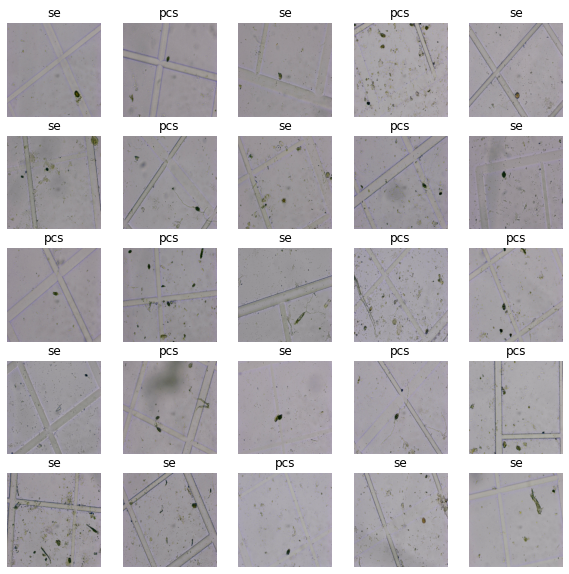

In [ ]:
# Now to visualize the data in a training batch
show_25_images(train_images, train_labels)

In [ ]:
# That's so cool! 
# Daniel said I should get different images each time I run this function but I don't?
# The training data is supposed to be shuffled each time

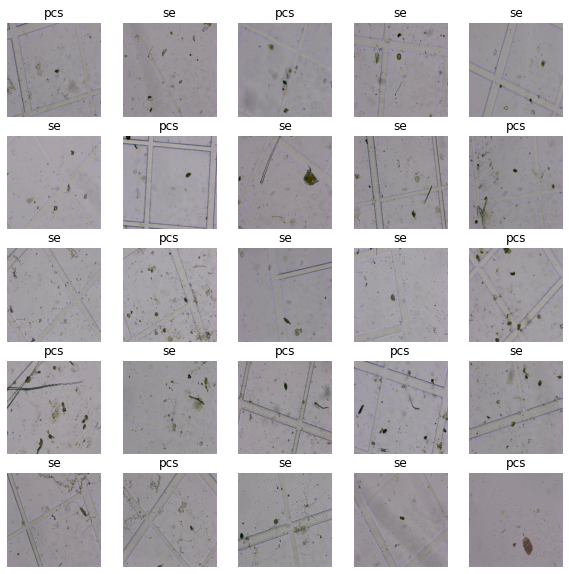

In [ ]:
# Now let's visualize our validation set 
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [ ]:
# AWESOME! I'll rerun this code next time and see if the images change
# The training dataset is shuffled but the validation set isn't
# Daniel wants us to figure out why this is.
# My training dataset didn't get shuffled I think cos I'm working with a small number of images? 


# Building a Model 

We need to define a few things before we build our model:

1.   The INPUT shape - i.e. our images shape in the form of Tensors to our model.
2.   The OUTPUT shape - i.e. the image labels in the form of Tensors  of our model.

1.   The URL of the model or ML Algorithm want to use. It's from TensorFlow Hub. 






In [ ]:
# We're using an existing model and adapting it rather than building one of our own from scratch
# It will save time and money. 


In [ ]:
IMG_SIZE

224

In [ ]:
# Set up Input shape to the model 
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]  # this is the batch, width, height and depth (color channels)

# Now the Output shape we want from our model. We want it to predict labels. 
# So will it be a two dimensional array. I have two labels pcs and se.
OUTPUT_SHAPE = len(unique_spores)

# Set up the model URL from TensorFlow Hub
# Which one though? Use the same one as the Dog Vision project? This was a multi class classification.
# This one is a binary classification problem. Is it a Facial Eczema spore (pcs) or something else (se)?

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

MODEL_2_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/5"



We're using Tensorflow Hub. Other platforms with models we can use include PyTorch Hub, Model Zoo and Papers with Code.

Tesla uses ResNet50 backbones. Go to a YouTube video titled "PyTorch at Tesla by Andrei Karpathy".

## TensorFlow and Keras

There are two different types of models we can build:

1.   Sequential model 
2.   Functional model 

We're using a **sequential** model because its a plain stack of layers. And each layer has only one input tensor and one output tensor.

Compared with **functional** models where either the model has multiple inputs and outputs or any layer has multiple inputs and outputs.


In [ ]:
# Using Keras we're going to build our model
# We've defined our image size, input and output shapes as well as 
# The url of the model we're going to use
# Let's create a function to put our input, layers and output altogether


This is what our function will do:


*   It takes the input shape, output shape and the model we've chosen as parameters.
*   As well as defining the layers sequentially in a Keras model.
*   Also compiles the model i.e. says how it is evaluated and improved...
*   Builds the model, telling it what input shape it will be getting and 
*   Lastly returns the model!! 







In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Let's set up the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),                   # Layer 1 - input layer
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="sigmoid")  # Layer 2 - output layer
  ])

  # Now compile the model. Refer to Daniels "International Hill Descending Championship analogy : ) .
  # I'm blindfolded at the top of a hill. Adam my friend is guiding me down.
  # A judge is scoring my effort using the "accuracy" method. How far away was I to where I was supposed to end up?
  model.compile(
      loss=tf.keras.losses.BinaryCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Finally let's build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
# Now to run it and see what happens!
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 2)                 2004      
                                                                 
Total params: 5,434,717
Trainable params: 2,004
Non-trainable params: 5,432,713
_________________________________________________________________


We're using a model that's been trained on a huge Imagenet data set of millions of images. It makes up our first layer. MobileNetV2 has a complex architecture of 11 layers of different shapes.

We add a layer of our own or a "dense" layer which gives us the output shape we want i.e. our label or one of the two unique spore types. One is "se" False(0) and the other True(1) or "pcs".

## Callbacks

Callbacks are functions that help a model during training. 


*   Save its progress
*   Check its progress
*   Stop its training if it doesn't improve






We'll create two callbacks

1.   One for TensorBoard which helps track the progress of our model and....
2.   Another early stopping one to save the training from going on too long



## TensorBoard Callback
To set this up we need to do three things:

*   Load the TensorBoard callback extension
*   Create a TensorBoard callback which is able to save logs to a directory and pass it to our models fit() function
*   Visualize our models training logs with the %tensorboard magic function. We'll do this after training.






In [ ]:
# Here goes
# Load TensorBoard Callback extension
%load_ext tensorboard

In [ ]:
import datetime       # this helps us track our experiments based on the time they take

In [ ]:
# Create a function to build a TensorBoard Callback
def create_tensorboard_callback():
  # Create a log directory for storing our TensorBoard logs in our PC Vision folder NOT trainpg!!
  log_dir = os.path.join("drive/MyDrive/P Chartarum Vision/P Chartarum Vision/logs",
                         # Make it so the logs get tracked whenever we run an experiment
                         datetime.datetime.now().strftime("%Y%m%d-%H%m%S"))
  return tf.keras.callbacks.TensorBoard(log_dir)

In [ ]:
# Now to create an early stopping callback to stop our model training if a certain evaluation metric stops improving
# This will prevent our model from overfitting - we want it to work well generally on data it hasn't seen yet


## Early Stopping Callback 

Check out tf.keras.callbacks.EarlyStopping for more information.

Here's the link.....[Early Stopping Callback](https://tensorflow.org/api_docs/python/tf.keras.callbacks.EarlyStopping)

In [ ]:
# Create early stopping callback 
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)


In [ ]:
# What is an Epoch? Remind myself of what it is.
# I have 400 training images. An epoch is when they have passed forward and backward through my model once.
# Our batch size is 32 so we need 400/32 or 12.5 i.e. 13 iterations to complete one EPOCH.


## Training a Model on a Subset of Data

This first model will be trained on all of the 399 images I have. So it's not really a subset. 

In [ ]:
# Let's define another variable and create a slider for it 
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# And a final check to make sure we still have GPU available
print("GPU is available. Yes!!" if tf.config.list_physical_devices("GPU") else "Not available : )")

GPU is available. Yes!!


### Let's create a simple function to train our model.



*   Create a model using `create_model()`
*   Set up a TensorBoard Callback using `create_tensorboard_callback`
*   Call the `fit()` function on our model, passing it our training data, validation data, the number of epochs to train for `NUM_EPOCHS` and the callbacks we'd like to use.
*   Finally return the model





In [ ]:
# Build a function to train and return a trained model 
def train_model():
  """
Trains a given model and returns the trained version

  """
  # Create a model
  create_model()

  # Create a new TensorBoard session each time we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we've created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model
  




In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
13/13 [==============================] - 29s 1s/step - loss: 0.9486 - accuracy: 0.5313 - val_loss: 0.7210 - val_accuracy: 0.6400
Epoch 2/100
13/13 [==============================] - 17s 1s/step - loss: 0.6982 - accuracy: 0.6341 - val_loss: 0.6610 - val_accuracy: 0.6500
Epoch 3/100
13/13 [==============================] - 17s 1s/step - loss: 0.6255 - accuracy: 0.6767 - val_loss: 0.6517 - val_accuracy: 0.6400
Epoch 4/100
13/13 [==============================] - 20s 2s/step - loss: 0.5948 - accuracy: 0.6992 - val_loss: 0.6389 - val_accuracy: 0.6300
Epoch 5/100
13/13 [==============================] - 18s 1s/step - loss: 0.5749 - accuracy: 0.7193 - val_loss: 0.6269 - val_accuracy: 0.6500


How did it go first time round?


*   It ran for seven epochs and then stopped because the accuracy wasn't improving 
*   Validation accuracy is better than training accuracy. Why is that? I'll need to listen to Daniel's video again.



In [ ]:
# Okay so this what we do next. Have a look at our TensorBoard report.
# It's the validation accuracy that stops the model if it's not improving 
# The first epoch takes the longest cos it's loading data into memory 
# Over fitting IS NOT a problem cos our model is performing equally well with the training vs validation data
# But is it learning? Have I confused it somehow?

### Checking the TensorBoard Logs

The TensorBoard Magic Function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/P\ Chartarum\ Vision/P\ Chartarum\ Vision/logs

<IPython.core.display.Javascript object>

# Making and evaluating predictions using a trained model

In [ ]:
# We do this with our validation data
# Ask it to make predictions and then compare these with the actual labels
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data which wasn't shuffled during fitting unlike the training set
predictions = model.predict(val_data, verbose=1) # verbose shows us how it is progresssing

4/4 [==============================] - 4s 727ms/step


In [ ]:
# Let's see what they look like
predictions

array([[0.40929934, 0.36583582],
       [0.22203894, 0.7500118 ],
       [0.39580345, 0.84557134],
       [0.23419975, 0.6025554 ],
       [0.6094669 , 0.3441374 ],
       [0.29324037, 0.7039611 ],
       [0.6467734 , 0.14405678],
       [0.62121767, 0.22579618],
       [0.7847749 , 0.378467  ],
       [0.60383123, 0.5372756 ],
       [0.35359663, 0.47957343],
       [0.76250577, 0.26125982],
       [0.5809846 , 0.42099363],
       [0.13810691, 0.78747624],
       [0.90853775, 0.0534816 ],
       [0.8420236 , 0.22462231],
       [0.4550782 , 0.56135917],
       [0.64874613, 0.34568903],
       [0.864535  , 0.27246   ],
       [0.27235976, 0.7062367 ],
       [0.5101594 , 0.5095825 ],
       [0.46774876, 0.72506016],
       [0.73248756, 0.745184  ],
       [0.02038579, 0.9769518 ],
       [0.90703344, 0.19256857],
       [0.7052427 , 0.2991388 ],
       [0.2837581 , 0.29269984],
       [0.5969182 , 0.23238519],
       [0.18634672, 0.89509994],
       [0.3506278 , 0.56248075],
       [0.

In [ ]:
# And the shape
predictions.shape

(100, 2)

In [ ]:
# Okay so the 100 stands for the 100 images in the validation data
# And the 2 stands for the two different predictions for "pcs" and "se"
len(y_val)

100

In [ ]:
# How many unique spores?
len(unique_spores)

2

In [ ]:
# Let's have a look at the first image predictions
predictions[0]

array([0.40929934, 0.36583582], dtype=float32)

### The highest value corresponds to the index of the most likely "spore" classification

In [ ]:
# The sum of these two predictions should be close to 1
np.sum(predictions[0])

0.77513516

In [ ]:
# And another one 
np.sum(predictions[54])

0.61840653

Indexing to make sense of these probability outputs 

In [ ]:
# Let's have a look at index of 54 
index = 54
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max Index: {np.argmax(predictions[index])}")
print(f"Predicted Label: {unique_spores[np.argmax(predictions[index])]}")

[0.32154885 0.29685766]
Max value (probability of prediction): 0.32154884934425354
Sum: 0.6184065341949463
Max Index: 0
Predicted Label: pcs


Having the above functionality is nice but we want to be able to do it to scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels

In [ ]:
# What type is predictions?
type(predictions)

numpy.ndarray

In [ ]:
# Let's turn prediction probabilities into their respective label (easier to understand)

def get_pred_label(prediction_probabilities):
  """
This function turns an array of prediction probabilities into a single label.

  """
  return unique_spores[np.argmax(prediction_probabilities)]
 
 

  



In [ ]:
# Try this function out. Get a predicted label based on an array of prediction probabilities.
pred_label = get_pred_label(predictions[0])
pred_label

'pcs'

In [ ]:
# Yippee it worked! 
# Where are the truth labels for our validation set?
# They should look like (None, 2)
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.bool, name=None))>

In [ ]:
# The truth labels are paired up with the validation images in batches of 32 
# We'll need to unbatchify the validation tuples 
# Let's create a function to do this

### A function to unbatch a batch data set 

In [ ]:
# I've done an example to see how it works
# Now to create a function 
def unbatchify(data):
  """
This function takes an unbatched data set of (image, label) tensors and returns separate arrays
of images and labels.

  """
  images = []
  labels = []
  # Loop through our unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_spores[np.argmax(label)])

  return images, labels

  


In [ ]:
# Let's unbatchify our validation set
val_images, val_labels = unbatchify(val_data)
val_images[18], val_labels[18]

(array([[[0.6212185 , 0.5937675 , 0.6212185 ],
         [0.6404962 , 0.6130452 , 0.6404962 ],
         [0.6388556 , 0.61532617, 0.6231693 ],
         ...,
         [0.6565121 , 0.62513953, 0.6682768 ],
         [0.63576424, 0.6004701 , 0.6671368 ],
         [0.64029604, 0.6089235 , 0.65864336]],
 
        [[0.64236695, 0.6227591 , 0.6462885 ],
         [0.6395058 , 0.6120548 , 0.6395058 ],
         [0.64711887, 0.62358946, 0.6314326 ],
         ...,
         [0.6594246 , 0.62805206, 0.6711893 ],
         [0.6373249 , 0.6020308 , 0.6686975 ],
         [0.6236695 , 0.59229696, 0.64327735]],
 
        [[0.64179677, 0.6143458 , 0.64179677],
         [0.6502101 , 0.6266807 , 0.64236695],
         [0.64236695, 0.61883754, 0.6345238 ],
         ...,
         [0.6458177 , 0.61444515, 0.6732687 ],
         [0.63473403, 0.5994399 , 0.6739497 ],
         [0.633264  , 0.6016712 , 0.6609352 ]],
 
        ...,
 
        [[0.5690581 , 0.54160714, 0.6710189 ],
         [0.49555817, 0.4703481 , 0.58183

In [ ]:
# Now to compare it with our predicted label
get_pred_label(val_labels[18])

'pcs'

In [ ]:
unique_spores[0]

'pcs'

In [ ]:
# So the true label for our image agrees with the predicted label
# Now to visualize these results 

Now we've got ways to get:


*   Predicted labels
*   Validation labels (truth labels)
*   Validation images

Let's make some functions to make these all a bit more visual.



We'll create a function that:

1.   Takes our array of prediction probabilities, an array of truth labels and an array of images and integers
2.   Convert the max predicted probabilities into a predicted label
1.   Plot the predicted label, it's predicted probability, the truth label and the target image on a single plot





In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
View the prediction, ground truth and image for sample n

  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n] 
  # Get the predicted label
  pred_label = get_pred_label(pred_prob)
  # Plot the image and get rid of the ticks by using empty lists
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on whether our pred label is right or wrong
  # Green for right and red for wrong

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Change plot title to be predicted label, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color);

                


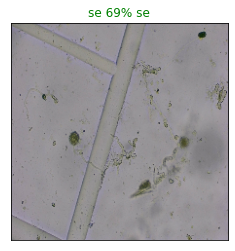

In [ ]:
# Let's have a look!
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=69)

How did that go?

In [ ]:
# Yippee it worked! I've tried it on three images and my model got 3/3 right! : ) 

# Visualizing our Top 2 Predictions

A function to view both of our models two predictions. This function will:

1.   Take an input of prediction probabilities array, a ground truth array and an integer
2.   Find the top prediction using `get_pred_label()`

1.   Find the top 2 

*   Prediction probabilities indexes
*   Prediction probabilities values

*   Prediction label
*   Finally plot the two prediction probability values and labels, coloring the true label green







In [ ]:
# Let's create a plot called Top 2 Predictions - there are only two cos it's a binary classification problem
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
This function plots the two highest prediction confidences along with the truth label for sample n.

  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top two prediction confidence indexes. Using argsort() instead of argmax()
  top_2_pred_indexes = pred_prob.argsort()[-2:][::-1]

# predictions[0].argsort() highest value is 1, next highest is 2
# predictions[0].argsort()[-2:]          slicing to find the top 2 indexes with the top 2 values
# predictions[0].argsort()[-2:][::-1]    will reverse the order so we have it in descending order
# predictions[0][predictions[0].argsort()[-2:][::-1]] this code outputs the actual values
# predictions[0].max()  this gives the top or highest prediction probability value
# unique_spores[predictions[0].argsort()[-2:][::-1]]

  # Find the top 2 prediction probability values
  top_2_pred_values = pred_prob[top_2_pred_indexes]

  # Find the top 2 prediction labes. The unique spore labels. 
  top_2_pred_labels = unique_spores[top_2_pred_indexes]

  # Finally let's set up our plot x and y axis pred_labels
  top_plot = plt.bar(np.arange(len(top_2_pred_labels)),
                     top_2_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_2_pred_labels)),
             labels=top_2_pred_labels,
             rotation="vertical")
  
  # Change the colour of the true label if it is in the top 2 of the predicted labels - it should be!
  if np.isin(true_label, top_2_pred_labels):
    top_plot[np.argmax(top_2_pred_labels == true_label)].set_color("green")
  else:
    pass
  

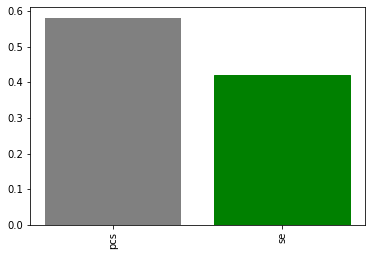

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=12)

## Final Visualization - combine `plot_pred()` and `plot_pred_conf()` on one plot.

We've created a couple of functions to help us visualize our predictions and evaluate it. Now to combine them and check out more than one at the same time.

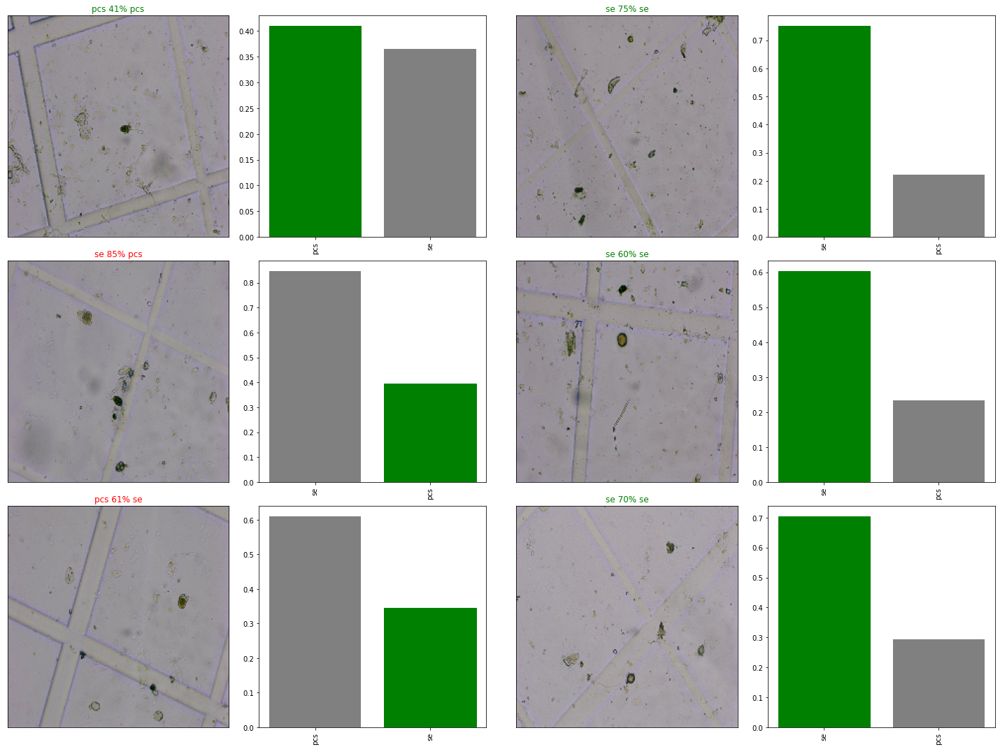

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 0 
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows)) 
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


In [ ]:
# Daniel has challenged us to create a confusion matrix to show visually where  our model is going wrong
# My model is a binary classification one so not much point in doing this

# Saving and Loading a Trained Model


In [ ]:
# It's good to be able to save our progress before we go on
# And it's a way of sharing my prototype - to get it out of our colab notebook somehow
# As well as not having to run all the cells
# Let's create a function to do this and a new folder names "models" in P Chartarum Vision
def save_model(model, suffix=None):
  """
Saves a given model in a models directory and appends a suffix (string).

  """
  # Create a model directory pathname with current time - it's like our TensorFlow Callbacks
  modeldir = os.path.join("drive/MyDrive/P Chartarum Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"    # this is the save format and extension we need to use
  print(f"Saving model to: {model_path}....") # to show our progress
  model.save(model_path)
  return model_path


In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
Loads a saved model from a specified path
  """
  print(f"Loading a saved model from: {model_path}.....")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

### The Ultimate Test 

Let's make sure these functions work!

In [ ]:
# Save my model that was trained on 399 images
save_model(model, suffix="399-images-mobilenetv2-Adam")   

Saving model to: drive/MyDrive/P Chartarum Vision/models/20221109-00321667953961-399-images-mobilenetv2-Adam.h5....


'drive/MyDrive/P Chartarum Vision/models/20221109-00321667953961-399-images-mobilenetv2-Adam.h5'

In [ ]:
# Load our trained model back again
loaded_399_image_model = load_model("drive/MyDrive/P Chartarum Vision/models/20221106-20111667765512-399-images-mobilenetv2-Adam.h5") # Copy the filepath from the previous cell 

Loading a saved model from: drive/MyDrive/P Chartarum Vision/models/20221106-20111667765512-399-images-mobilenetv2-Adam.h5.....


### Excellent it worked

In [ ]:
# Now to see if it performs as well as the pre-saved model
# Evaluate the pre-saved model
model.evaluate(val_data)

4/4 [==============================] - 3s 744ms/step - loss: 0.6269 - accuracy: 0.6500


[0.6268828511238098, 0.6499999761581421]

In [ ]:
# And evaluate our saved model
loaded_399_image_model.evaluate(val_data)


4/4 [==============================] - 4s 760ms/step - loss: 0.6493 - accuracy: 0.6600


[0.6492917537689209, 0.6600000262260437]

In [ ]:
# Yay the values are the same!

In [ ]:
# Ideally I should now take more images to increase the size of my training and validation sets
# Instead I'm going to create two batches (size=32) of test images
# I won't load the labels into this notebook but I will create an Xcel or csv file with the test images 
# And their true labels so I can see how well my model performs

In [ ]:
# That's 64 images which shouldn't take long

# Making predictions on my custom images



*   Since our model has been trained on images in the form of Tensor Batches,to make predictions on our test data we'll need to get our test images in the same format
*   Luckily we've created our own custom functions earlier on, like `create_data_batches()`. It takes a list of filenames as input and converts them into Tensor batches.



*   To make predictions on the custom test data we'll do these things: - 


1.   Get the test image filenames
2.   Convert the filenames into test data batches using `create_data_batches`

1.   Set the `test_data` parameter to "True", because it doesn't have any labels
2.   Create a predictions array by passing the test batches to the `predict()` method called on our model


In [ ]:
# Pre process my custom images so they are the same as my trainjpg set
# Create a folder in P Chartarum Vision called "custom-fe-photos"
# Then upload my custom images into this folder

In [ ]:
# Let's get the test image filenames first 
custom_path = "drive/MyDrive/P Chartarum Vision/custom-fe-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]


In [ ]:
custom_image_paths

['drive/MyDrive/P Chartarum Vision/custom-fe-photos/2022061641.jpg',
 'drive/MyDrive/P Chartarum Vision/custom-fe-photos/2022061637.jpg',
 'drive/MyDrive/P Chartarum Vision/custom-fe-photos/2022061633.jpg']

In [ ]:
# turn custom images into batch data sets even though there are only a few of them
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches.....


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on our custom data batch using our loaded saved model
custom_preds = loaded_399_image_model.predict(custom_data)

1/1 [==============================] - 1s 920ms/step


In [ ]:
custom_preds

array([[0.2752183 , 0.71914434],
       [0.43076998, 0.7264436 ],
       [0.863452  , 0.12366152]], dtype=float32)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['se', 'se', 'pcs']

In [ ]:
# Get our custom images. Unbatchify won't work cos we don't have any labels.
custom_images = []
# loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

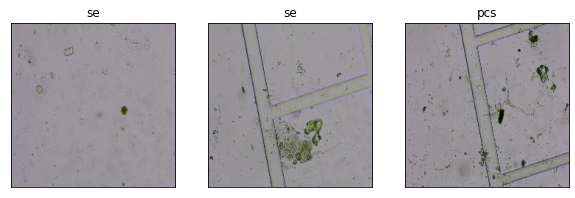

In [ ]:
# Now to visualize this 
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

### My model got 2 out of 3 correct! 

They are all images of something else - not a Pithomyces 
Chartarum spore. I'm still so proud of building a model and proving that it has promise for automating facial eczema spore counting in the future. Next steps could be: 



*   watching videos on how to share this with others
*   a brainstorm to work out who to share it with first

*   perhaps Robbie Cook or people I met at the NZVA conference like: 
*   Cristin Dwyer - Head of Vet Services Large Animal


*   Francesca Brown of Sustain Vet
*   Lisa Hulme of Gribbles Laboratories


*   Rae Pearson (Sales) and Sandra Forsyth (Pathologist) of SVS Lab
*   VetEnt research vets - Emma Cuttance


*   MPI Animal Health & Welfare F.E. Steering Group - Stuart Bruere, Keith ?, Doug ?
*   MPI Justin Nercier


*   Samantha Tennent of ?
*   DPS Sue Macky and Brian McKay













In [ ]:
# The next step(s) will involve getting more specific. Who is this for right now?
# And making choices. Eek! Remember choosing say 1 option out of 5 and running with it is better than just standing still!
# Even if it turns out "wrong" at least I've learned something I didn't know before.
# Go to GitHub and upload my model or this notebook with code. 
# Direct potential project leaders to my blog posts

# Communicating my Work to
 * Managers
 * Co-workers
 * The outside world!

Some of these people are non-technical or don't know a lot about Deep Learning. 

I'll need to be able to share with them my project and explain what a DL classification model does and what I found out. 

I'll also have to spell out the benefits of a model like this. They will be different depending on who I'm communicating with. VetEnt, Massey University and Gribbles could be likely businesses I could work with. Specifically Emma Cuttance from VetEnt, Richard Laven from Massey University and ? from Gribbles.I'd like to share with Sue Macky what I'm doing too.

In the future using A.I. to help with identifying the major risk factors contributing to profit limiting diseases on N.Z. Dairy Farms. 

I see this initially as a Video Game. Goodies vs Baddies. Agents working together to come up with the best long term solution and winning the most points. Or like Emirates Team NZ building the fastest boats sailed by the best always learning and iterating teams. They learn by trying to beat a dairy farmer "bot".



# Who would be interested in using or buying an App based on a Deep Learning Model such as this?

A first step might be to find people that could classify my training images to see how much variation there is between us, the so called 'Experts'.
